In [5]:
from ydata_profiling import ProfileReport
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [9]:
df=pd.read_csv('D:/New folder/mony/data analysis/diabetes.csv')

In [11]:
profile = ProfileReport(df)

In [13]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 769 entries, 0 to 768
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               769 non-null    int64  
 1   Glucose                   769 non-null    int64  
 2   BloodPressure             769 non-null    int64  
 3   SkinThickness             769 non-null    int64  
 4   Insulin                   769 non-null    int64  
 5   BMI                       769 non-null    float64
 6   DiabetesPedigreeFunction  769 non-null    float64
 7   Age                       769 non-null    int64  
 8   Outcome                   769 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.2 KB


In [17]:
df.duplicated().sum()

0

In [19]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,769.000000,769.000000,769.000000,769.000000,769.000000,769.000000,769.000000,769.000000,769.000000
mean,3.840052,120.897269,69.115735,20.509753,79.697009,31.998179,0.471590,33.269181,0.349805
std,3.370237,31.951886,19.345296,15.959020,115.203999,7.880557,0.331208,11.778737,0.477219
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.244000,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,29.000000,32.000000,0.371000,29.000000,0.000000
75%,6.000000,140.000000,80.000000,32.000000,127.000000,36.600000,0.626000,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [23]:
df.nunique()

Pregnancies                  17
Glucose                     136
BloodPressure                48
SkinThickness                51
Insulin                     187
BMI                         248
DiabetesPedigreeFunction    517
Age                          52
Outcome                       2
dtype: int64

In [25]:
df.head(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
5,5,116,74,0,0,25.6,0.201,30,0
6,3,78,50,32,88,31.0,0.248,26,1
7,10,115,0,0,0,35.3,0.134,29,0
8,2,197,70,45,543,30.5,0.158,53,1
9,8,125,96,0,0,0.0,0.232,54,1


In [29]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
df = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [31]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df.drop('Outcome', axis=1))


<Figure size 800x500 with 0 Axes>

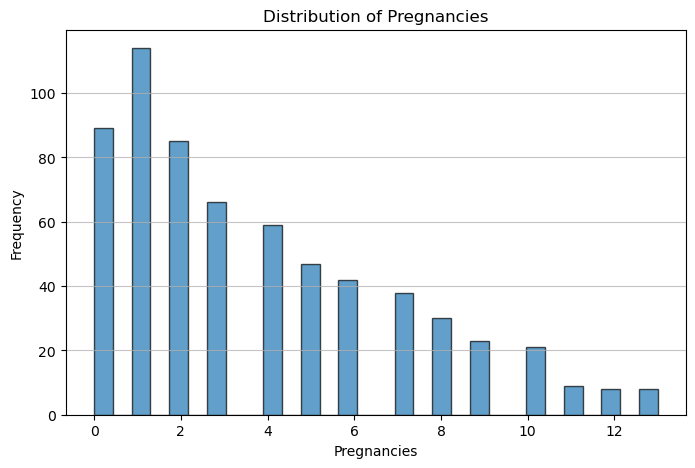

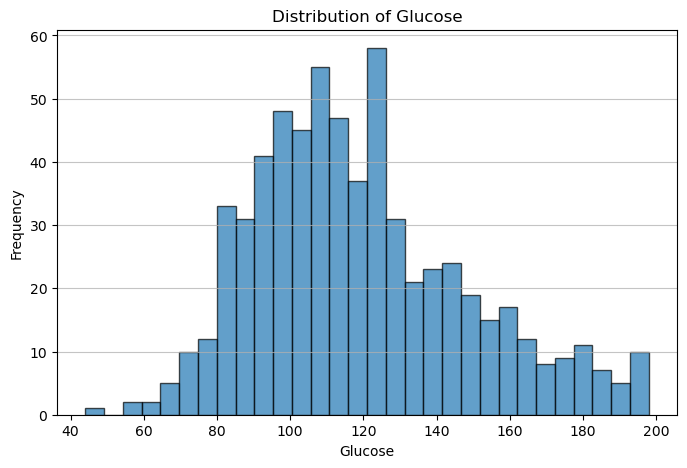

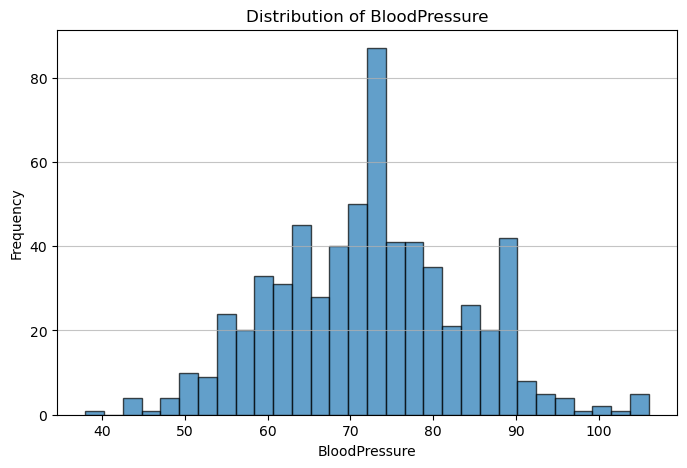

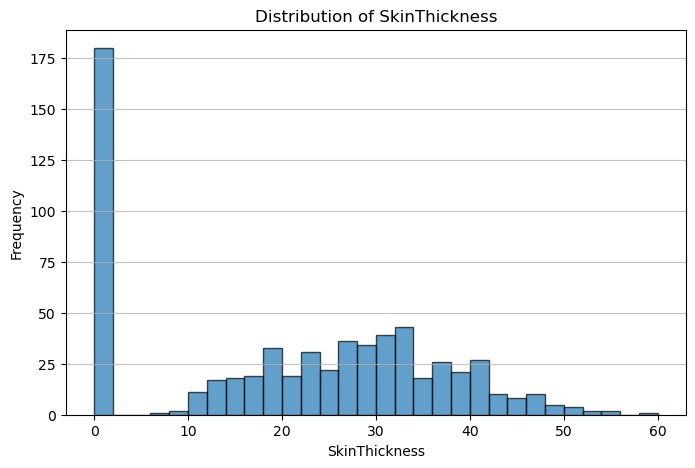

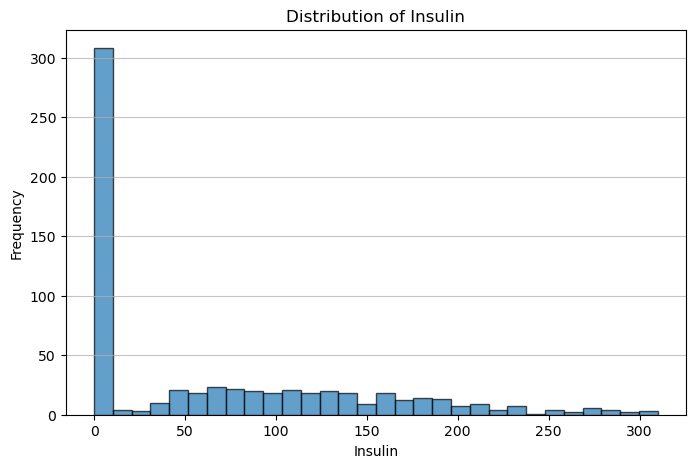

...

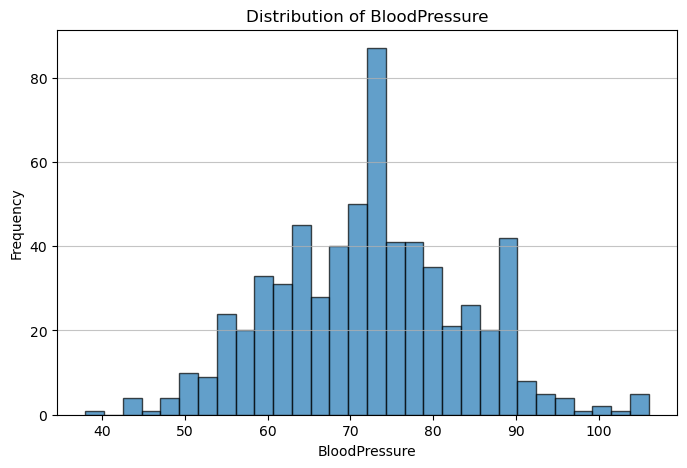

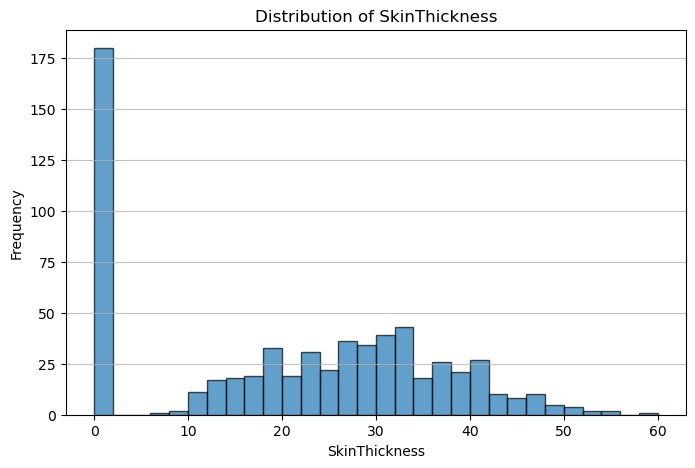

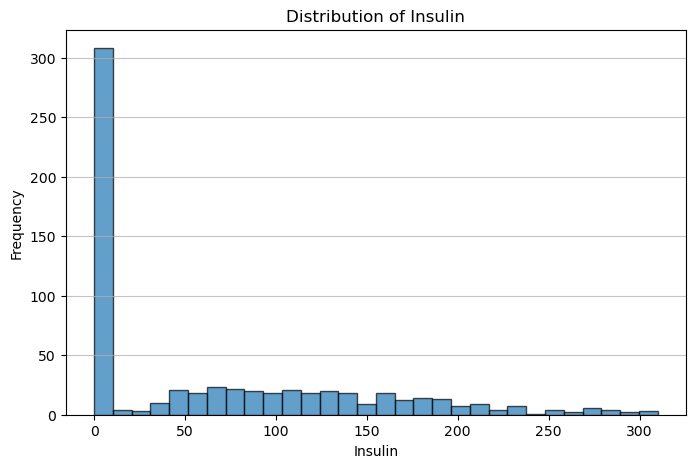

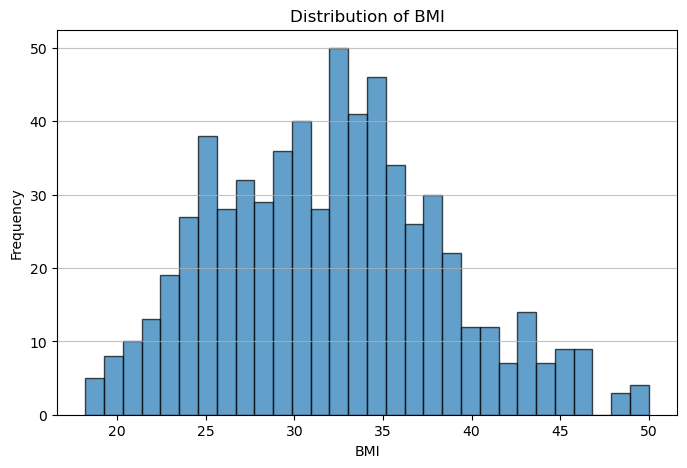

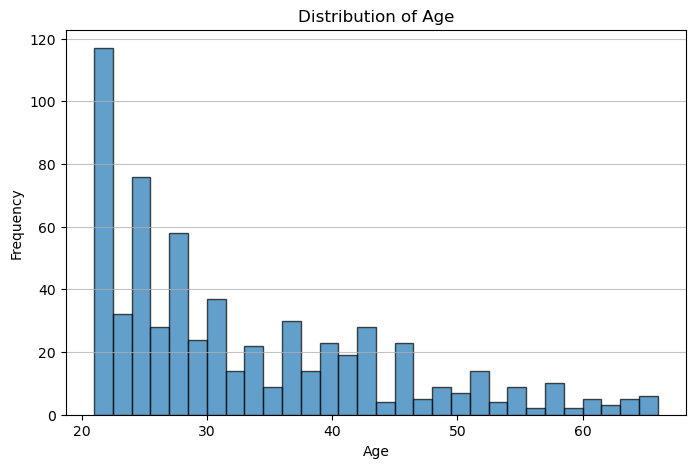

In [39]:
%matplotlib inline

numeric_columns = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'Age']

for column in numeric_columns:
    plt.figure(figsize=(8, 5))
    plt.hist(df[column], bins=30, edgecolor='k', alpha=0.7)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.grid(axis='y', alpha=0.75)
    plt.show()


In [45]:
columns_with_zeros = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']

for column in columns_with_zeros:
    median_value = df[column][df[column] != 0].median() 
    df[column] = df[column].replace(0, median_value)  

df.describe()


C:\Users\DELL\AppData\Local\Temp\ipykernel_2644\1699131686.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = df[column].replace(0, median_value)


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,639.000000,639.000000,639.000000,639.000000,639.000000,639.000000,639.000000,639.000000,639.000000
mean,3.798122,119.073552,72.147105,28.690141,120.685446,32.014241,0.429336,32.755869,0.312989
std,3.264456,29.140120,11.340151,8.399195,47.984156,6.436061,0.250812,11.114671,0.464073
min,0.000000,44.000000,38.000000,7.000000,1.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,64.000000,25.000000,111.000000,27.300000,0.243500,24.000000,0.000000
50%,3.000000,114.000000,72.000000,29.000000,115.000000,32.000000,0.358000,29.000000,0.000000
75%,6.000000,136.500000,80.000000,32.000000,120.000000,36.000000,0.586000,40.000000,1.000000
max,13.000000,198.000000,106.000000,60.000000,310.000000,50.000000,1.191000,66.000000,1.000000


                          Pregnancies   Glucose  BloodPressure  SkinThickness  \
Pregnancies                  1.000000  0.141710       0.209920       0.127766   
Glucose                      0.141710  1.000000       0.240868       0.136165   
BloodPressure                0.209920  0.240868       1.000000       0.219508   
SkinThickness                0.127766  0.136165       0.219508       1.000000   
Insulin                      0.053898  0.413966       0.090019       0.185697   
BMI                          0.035707  0.192995       0.303590       0.558834   
DiabetesPedigreeFunction     0.010681  0.068202       0.021980       0.054006   
Age                          0.561477  0.286964       0.354001       0.137234   
Outcome                      0.224902  0.491122       0.186914       0.184562   

                           Insulin       BMI  DiabetesPedigreeFunction  \
Pregnancies               0.053898  0.035707                  0.010681   
Glucose                   0.413966  0.192

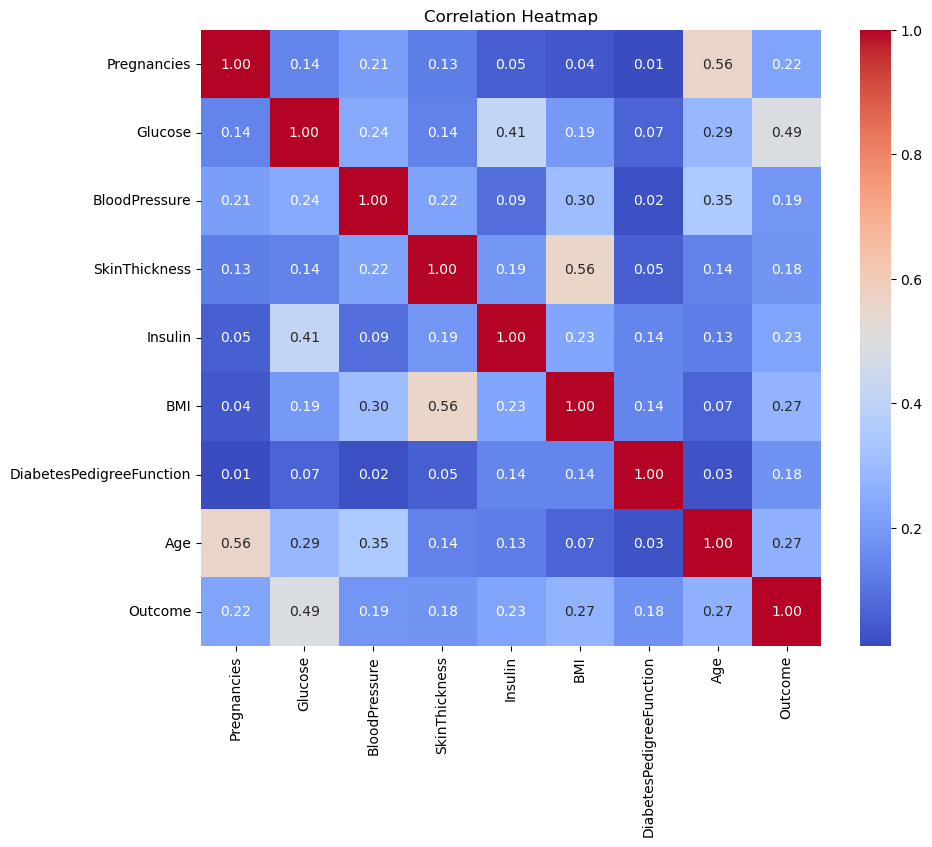

In [49]:

correlation_matrix = df.corr()


print(correlation_matrix)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap")
plt.show()


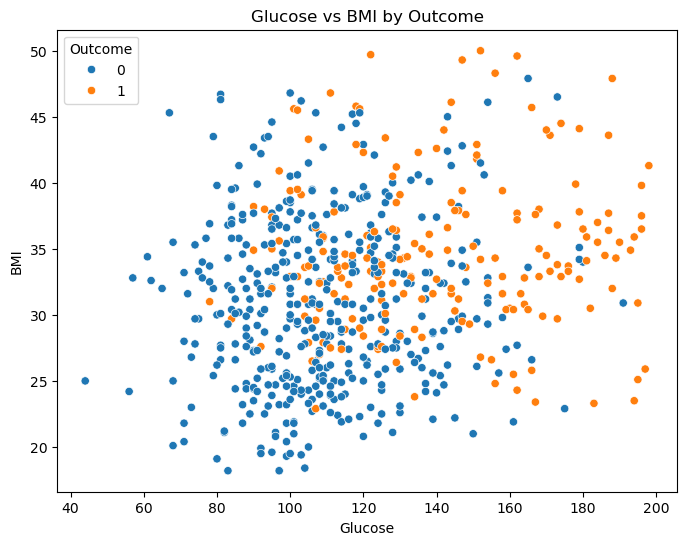

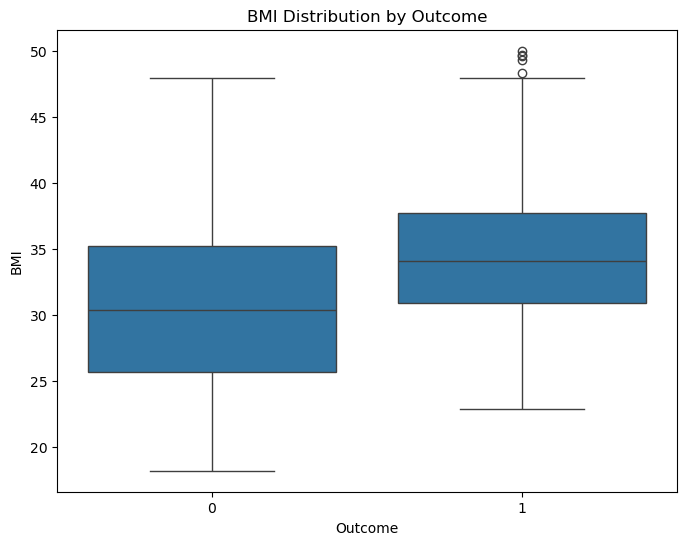

In [51]:

plt.figure(figsize=(8, 6))
sns.scatterplot(x='Glucose', y='BMI', hue='Outcome', data=df)
plt.title('Glucose vs BMI by Outcome')
plt.xlabel('Glucose')
plt.ylabel('BMI')
plt.legend(title='Outcome')
plt.show()


plt.figure(figsize=(8, 6))
sns.boxplot(x='Outcome', y='BMI', data=df)
plt.title('BMI Distribution by Outcome')
plt.xlabel('Outcome')
plt.ylabel('BMI')
plt.show()


C:\Users\DELL\AppData\Local\Temp\ipykernel_2644\3096076277.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Outcome', data=df, palette='viridis')


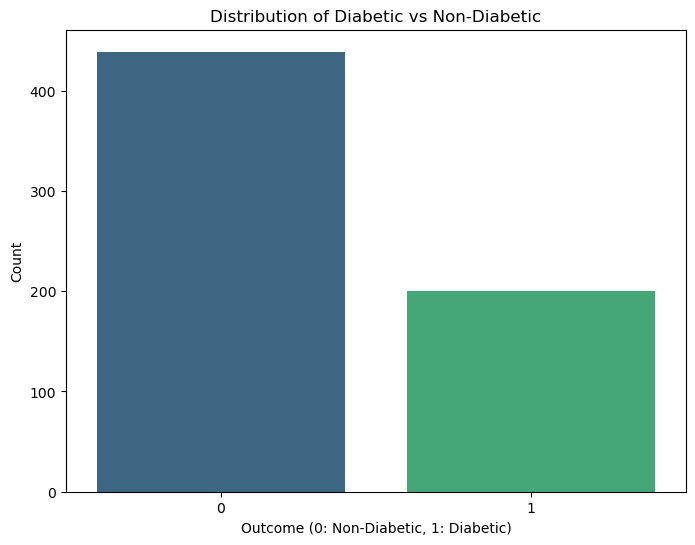

In [53]:
plt.figure(figsize=(8, 6))
sns.countplot(x='Outcome', data=df, palette='viridis')
plt.title('Distribution of Diabetic vs Non-Diabetic')
plt.xlabel('Outcome (0: Non-Diabetic, 1: Diabetic)')
plt.ylabel('Count')
plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_2644\3825694299.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Outcome', y='Age', data=df, palette='coolwarm')


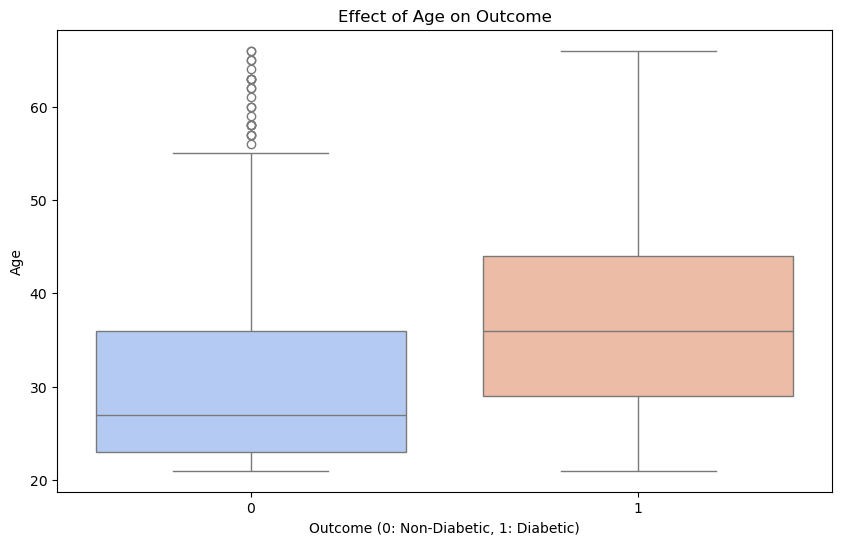

In [55]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Outcome', y='Age', data=df, palette='coolwarm')
plt.title('Effect of Age on Outcome')
plt.xlabel('Outcome (0: Non-Diabetic, 1: Diabetic)')
plt.ylabel('Age')
plt.show()

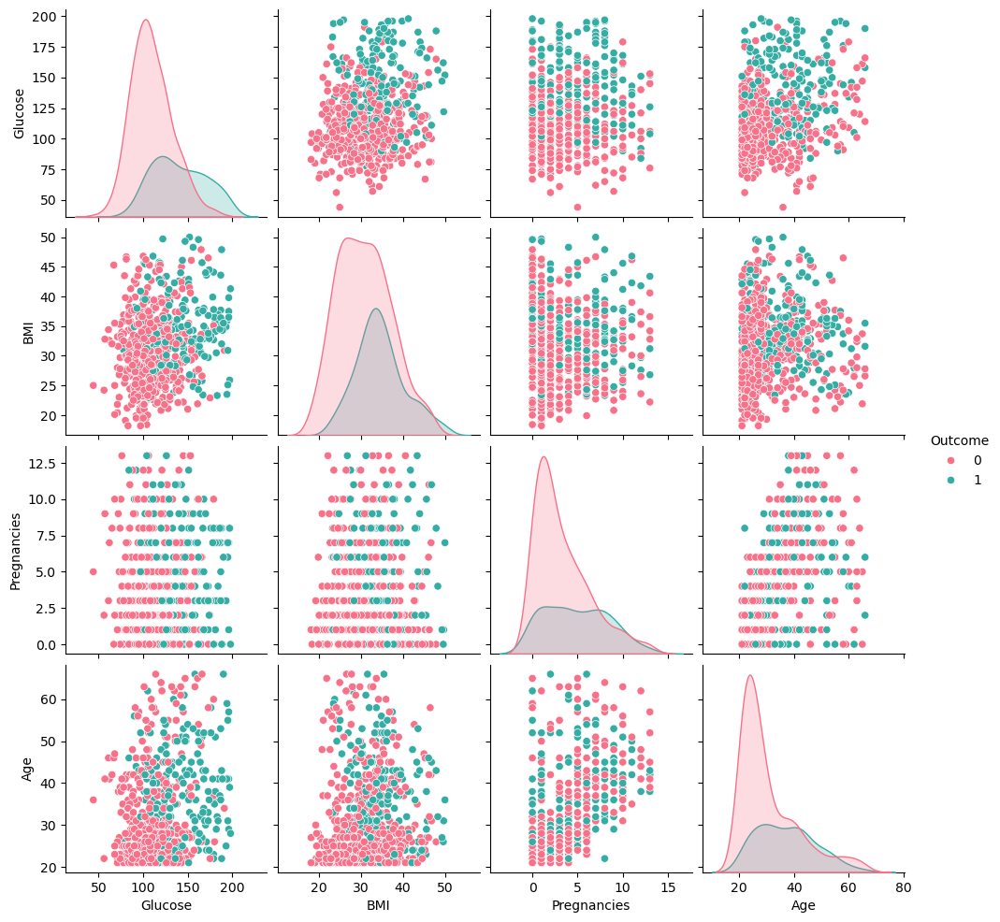

In [57]:
sns.pairplot(df, vars=['Glucose', 'BMI', 'Pregnancies', 'Age'], hue='Outcome', palette='husl')
plt.show()

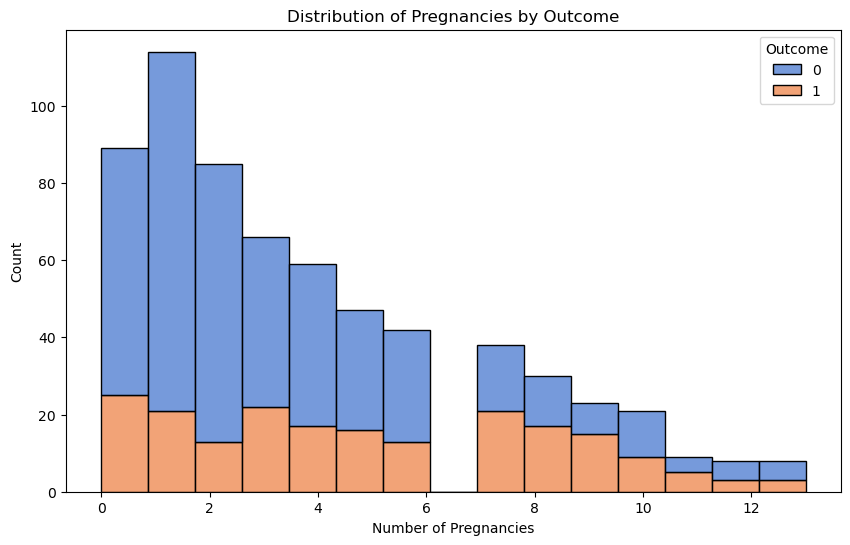

In [59]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='Pregnancies', hue='Outcome', multiple='stack', kde=False, palette='muted', bins=15)
plt.title('Distribution of Pregnancies by Outcome')
plt.xlabel('Number of Pregnancies')
plt.ylabel('Count')
plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_2644\2371515221.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Outcome', y='BMI', data=df, palette='Set2', split=True)


<Figure size 1000x600 with 0 Axes>

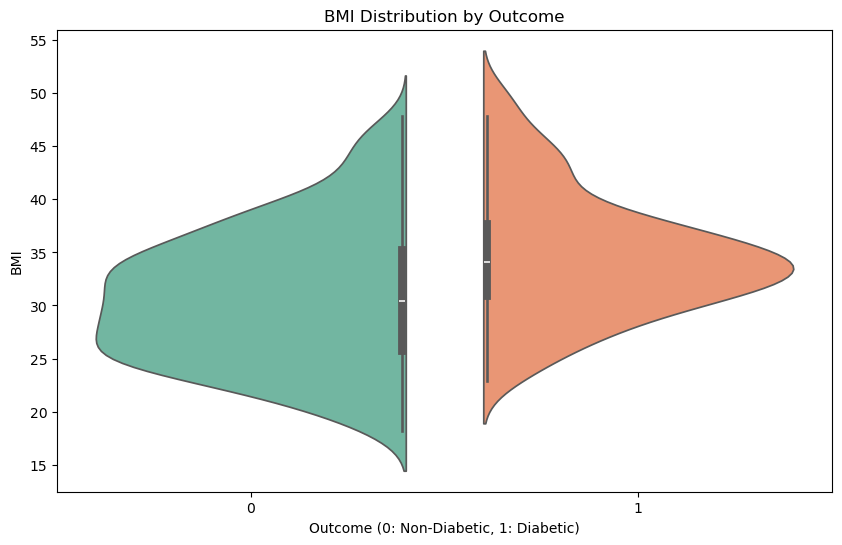

In [63]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='Outcome', y='BMI', data=df, palette='Set2', split=True)
plt.title('BMI Distribution by Outcome')
plt.xlabel('Outcome (0: Non-Diabetic, 1: Diabetic)')
plt.ylabel('BMI')
plt.show()

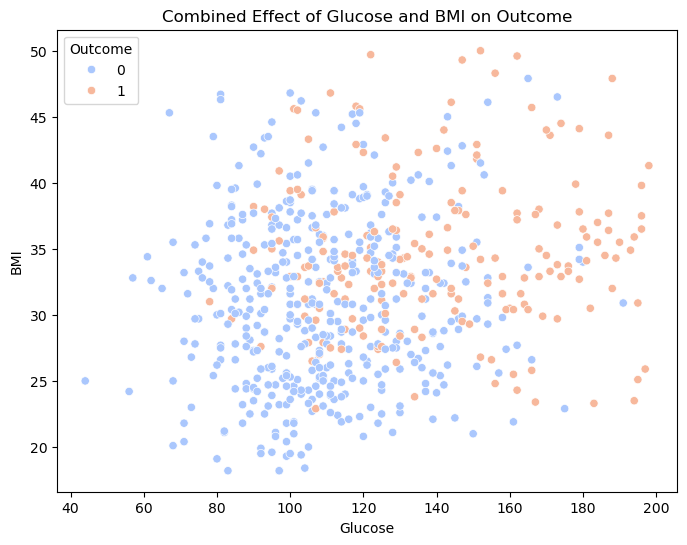

In [65]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Glucose', y='BMI', hue='Outcome', data=df, palette='coolwarm')
plt.title('Combined Effect of Glucose and BMI on Outcome')
plt.xlabel('Glucose')
plt.ylabel('BMI')
plt.show()

<Figure size 800x600 with 0 Axes>

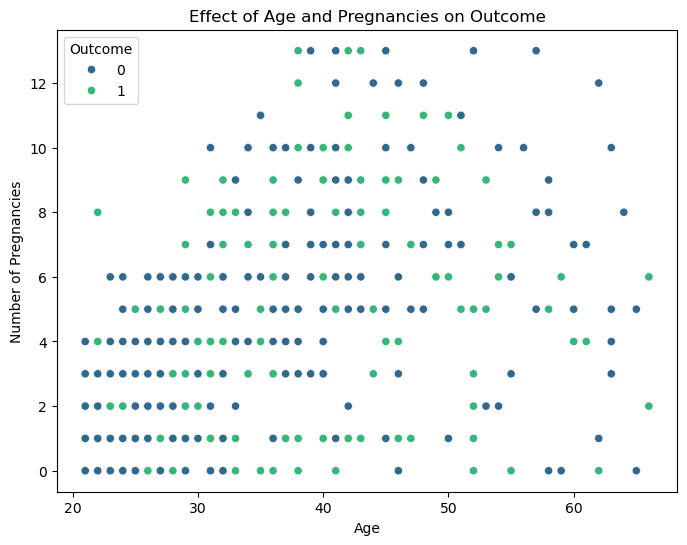

In [71]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Age', y='Pregnancies', hue='Outcome', data=df, palette='viridis')
plt.title('Effect of Age and Pregnancies on Outcome')
plt.xlabel('Age')
plt.ylabel('Number of Pregnancies')
plt.show()

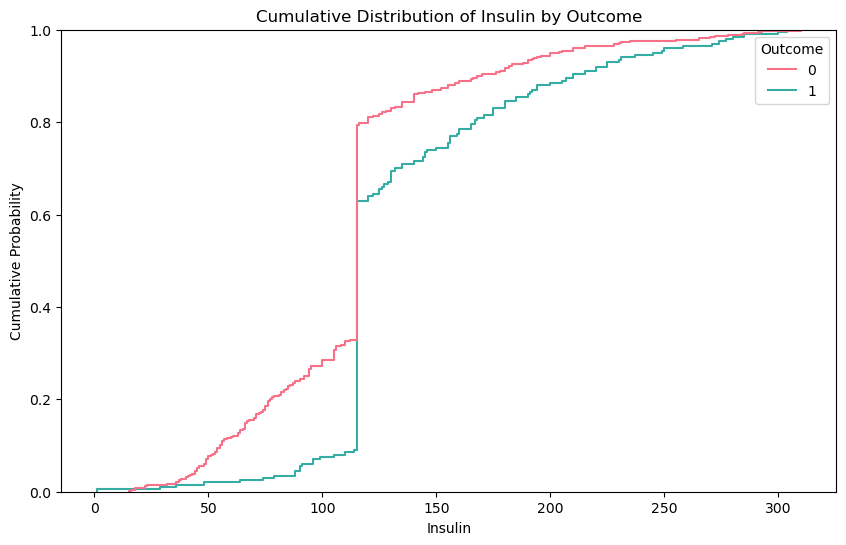

In [73]:
plt.figure(figsize=(10, 6))
sns.ecdfplot(data=df, x='Insulin', hue='Outcome', palette='husl')
plt.title('Cumulative Distribution of Insulin by Outcome')
plt.xlabel('Insulin')
plt.ylabel('Cumulative Probability')
plt.show()

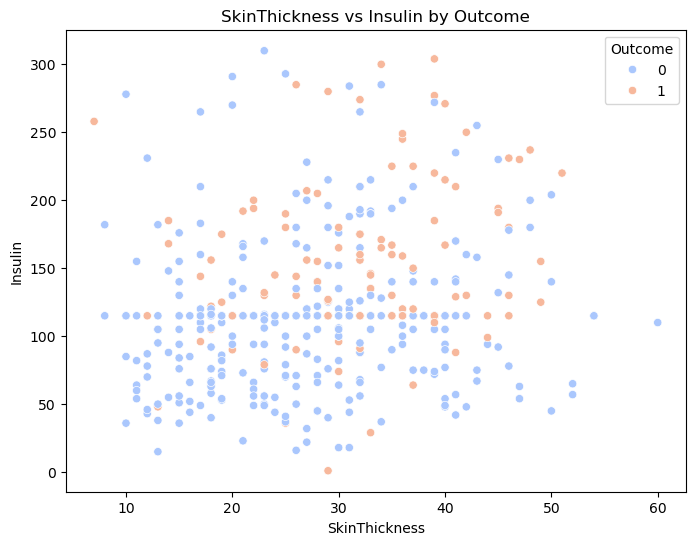

In [75]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='SkinThickness', y='Insulin', hue='Outcome', data=df, palette='coolwarm')
plt.title('SkinThickness vs Insulin by Outcome')
plt.xlabel('SkinThickness')
plt.ylabel('Insulin')
plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_2644\2461757735.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Outcome', y='BloodPressure', data=df, palette='Set2')


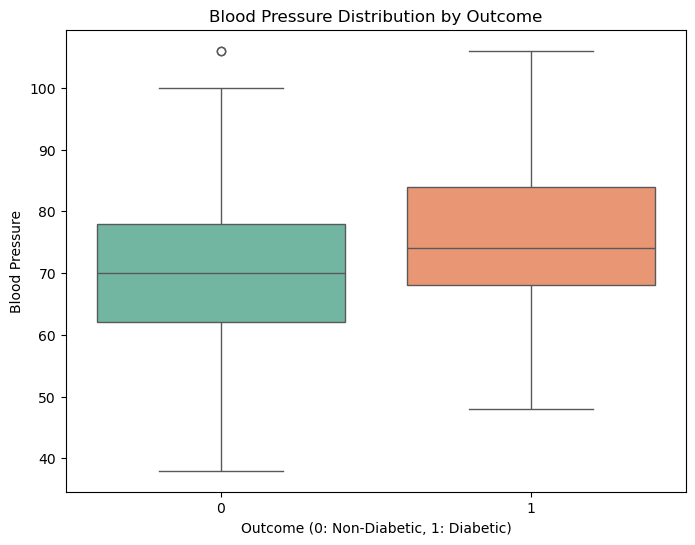

In [77]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='Outcome', y='BloodPressure', data=df, palette='Set2')
plt.title('Blood Pressure Distribution by Outcome')
plt.xlabel('Outcome (0: Non-Diabetic, 1: Diabetic)')
plt.ylabel('Blood Pressure')
plt.show()

<Figure size 800x600 with 0 Axes>

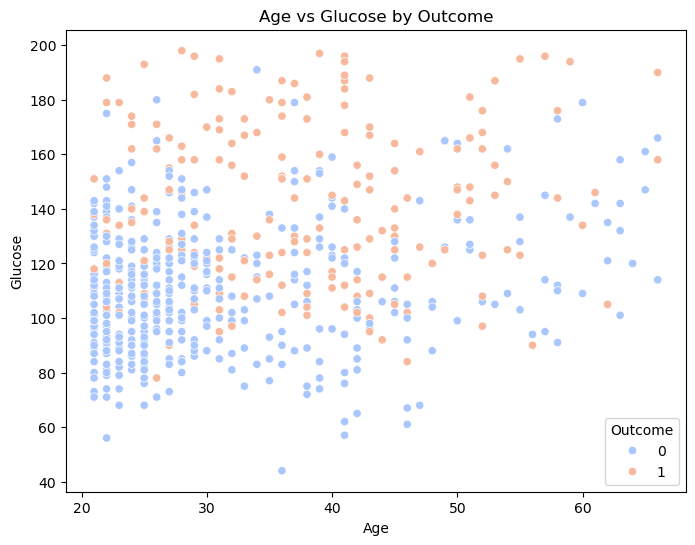

In [81]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Age', y='Glucose', hue='Outcome', data=df, palette='coolwarm')
plt.title('Age vs Glucose by Outcome')
plt.xlabel('Age')
plt.ylabel('Glucose')
plt.show()